In [1]:
import torch
import matplotlib.pyplot as plt
from torch import optim, distributions, nn
from tqdm.notebook import tqdm
from gpzoo.kernels import MGGP_NSF_RBF
from gpzoo.gp import MGGP_NSF
import squidpy as sq
import numpy as np

/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/nsf/lib/python3.9/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/nsf/lib/python3.9/site-packages/spatialdata/__init__.py:9: UserWarning: Geopandas was set to use PyGEOS, changing to shapely 2.0 with:

	geopandas.options.use_pygeos = True

If you intended to use PyGEOS, set the option to False.
  _check_geopandas_using_shapely()


In [2]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [3]:
new_model=False

In [4]:
adata = sq.datasets.visium_hne_adata()

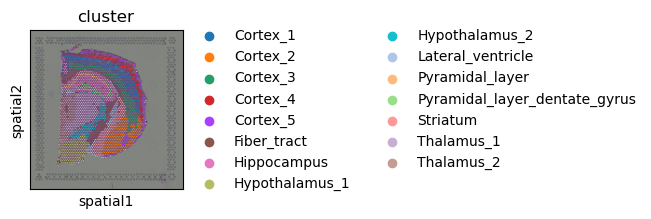

In [5]:
sq.pl.spatial_scatter(adata, color="cluster")

In [6]:
Y_sums = np.array(np.sum(adata.raw.X > 0, axis=0))[0]
Y = np.array(adata.raw.X[:, Y_sums>200].todense(), dtype=int).T
X = adata.obsm['spatial']

In [7]:
Y.shape

(11925, 2688)

In [8]:
X.shape

(2688, 2)

In [9]:
X = torch.tensor(X, dtype=torch.float)
Y = torch.tensor(Y, dtype=torch.float)

In [10]:
L =10
M = 120
groupsX = torch.tensor(adata.obs.cluster.values.codes).type(torch.LongTensor)
n_groups = len(adata.obs.cluster.values.categories)

kernel = MGGP_NSF_RBF(sigma=2.0, lengthscale=5.0, group_diff_param=10, n_groups=n_groups, device=device)

model = MGGP_NSF(X=X, y=Y, kernel=kernel, M=M, L=L, jitter=1e-2, n_groups=n_groups)

idz = torch.multinomial(torch.ones(X.shape[0]), num_samples=M*n_groups, replacement=False)
model.svgp.Z = nn.Parameter(X[idz])
model.svgp.groupsZ = (groupsX[idz].clone()).to(device)

In [12]:
model.to(device)

MGGP_NSF(
  (kernel): MGGP_NSF_RBF()
  (svgp): MGGP_SVGP(
    (kernel): MGGP_NSF_RBF()
  )
)

In [13]:
def train(model, optimizer, X, groupsX, y, steps=200, E=20):
    losses = []
    for it in tqdm(range(steps)):

        optimizer.zero_grad()
        pY, qF, qU, pU = model(X, groupsX, E=E)


        ELBO = (pY.log_prob(y)).mean(axis=0).sum()

        ELBO -= torch.sum(distributions.kl_divergence(qU, pU))


        loss = -ELBO
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
    
    with torch.no_grad():
        if device.type=='cuda':
            torch.cuda.empty_cache()
        
    return losses

In [14]:
X_train = X.to(device)
Y_train = Y.to(device)
groupsX = groupsX.to(device)

In [15]:
optimizer = optim.Adam(model.parameters(), lr=1e-3)

In [22]:
losses = train(model, optimizer, X_train, groupsX, Y_train, steps=3000)

  0%|          | 0/3000 [00:00<?, ?it/s]

In [44]:
torch.save(model.state_dict(), 'visium_nsf') 

In [23]:
model.kernel.group_diff_param

Parameter containing:
tensor([[[7.4106]],

        [[7.7965]],

        [[7.7346]],

        [[8.1201]],

        [[7.1687]],

        [[7.3387]],

        [[7.6330]],

        [[7.8333]],

        [[7.4028]],

        [[7.6001]]], device='cuda:0', requires_grad=True)

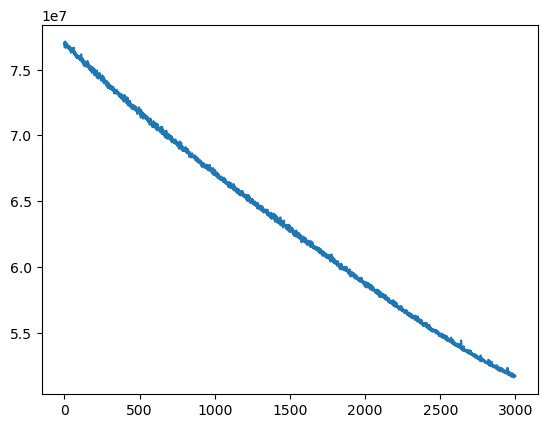

In [24]:
plt.plot(losses)

In [25]:
qF, qU, pU = model.svgp(X_train, groupsX)
loadings = torch.exp(qF.mean).detach().cpu().numpy()
del qF, qU, pU
with torch.no_grad():
    if device.type=='cuda':
        torch.cuda.empty_cache()

In [26]:
model.kernel.lengthscale

Parameter containing:
tensor([[[5.7060]],

        [[5.6653]],

        [[5.8479]],

        [[5.6696]],

        [[5.9350]],

        [[5.6321]],

        [[6.0198]],

        [[5.7865]],

        [[5.4966]],

        [[5.6793]]], device='cuda:0', requires_grad=True)

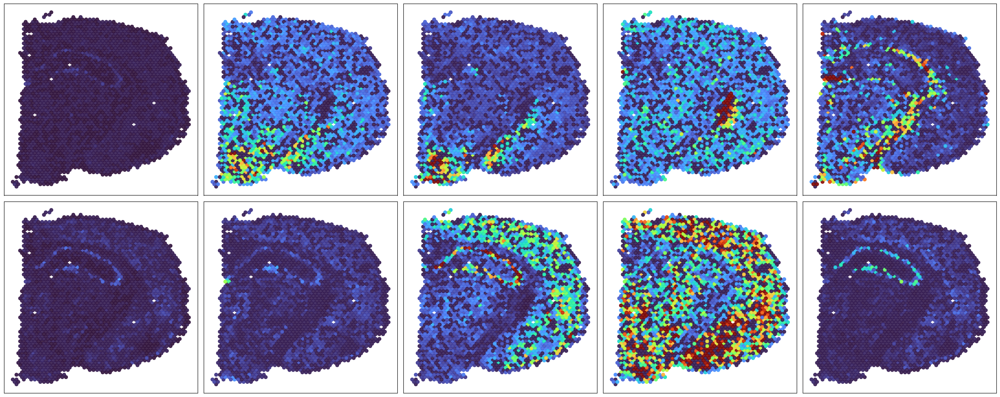

In [27]:
max_val = np.percentile(loadings, 99)
min_val = np.percentile(loadings, 1)


size = 5
plt.figure(figsize=(size*5, size*2), tight_layout=True)
for i in range(L):
    plt.subplot(L//5, 5, i+1)
    plt.scatter(X[:, 0], X[:,1], c=loadings[i], vmin=min_val, vmax=max_val, alpha=0.9, cmap='turbo')

    plt.gca().invert_yaxis()
    plt.xticks([])
    plt.yticks([])

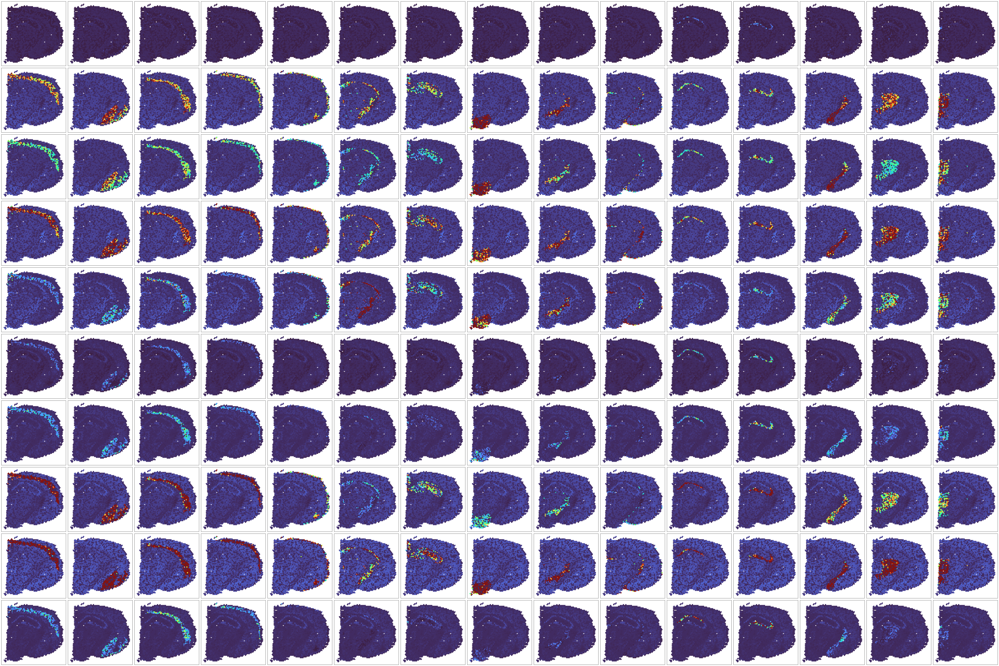

In [68]:
all_loadings = []
for group_index in range(n_groups):
    groupsTest = torch.ones_like(groupsX) * group_index
    qF, qU, pU = model.svgp(X_train, groupsTest)
    loadings = torch.exp(qF.mean).detach().cpu().numpy()
    del qF, qU, pU
    with torch.no_grad():
        if device.type=='cuda':
            torch.cuda.empty_cache()
            
    all_loadings.append(loadings)
    
all_loadings = np.array(all_loadings)

    
max_val = np.percentile(all_loadings, 99)
min_val = np.percentile(all_loadings, 1)


size = 5
plt.figure(figsize=(size*n_groups, size*L), tight_layout=True)
for i in range(L):
    for group_index in range(n_groups):
        plt.subplot(L, n_groups, (i*n_groups)+group_index+1)
        plt.scatter(X[:, 0], X[:,1], c=all_loadings[group_index, i], vmin=min_val, vmax=max_val, alpha=0.9, cmap='turbo')

        plt.gca().invert_yaxis()
        plt.xticks([])
        plt.yticks([])